# Initial Conditions Optimization
## Plot History

In [5]:
%matplotlib inline
import matplotlib
matplotlib.font_manager._rebuild()
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from datetime import datetime,timedelta
import matplotlib.style as style
style.use('fivethirtyeight')
import ray
import io
import os
from IPython.display import display, HTML, Markdown

## Load PlayFair Display and Roboto Fonts from Google

In [6]:
from tempfile import NamedTemporaryFile
import urllib.request
import matplotlib.font_manager as fm

github_url = 'https://github.com/google/fonts/blob/master/ofl/playfairdisplay/static/PlayfairDisplay-Regular.ttf'
url = github_url + '?raw=true'  # You want the actual file, not some html

request = urllib.request.Request(url)
response = urllib.request.urlopen(request)
f = NamedTemporaryFile(delete=False, suffix='.ttf')
f.write(response.read())
f.close()
heading_font = fm.FontProperties(fname=f.name, size=28)

github_url = 'https://github.com/google/fonts/blob/master/apache/roboto/static/Roboto-Regular.ttf'
url = github_url + '?raw=true'  # You want the actual file, not some html

request = urllib.request.Request(url)
response = urllib.request.urlopen(request)
f = NamedTemporaryFile(delete=False, suffix='.ttf')
f.write(response.read())
f.close()
subtitle_font = fm.FontProperties(fname=f.name, size=20)


## Load Humor Sans Font

In [7]:
# github_url = 'http://antiyawn.com/uploads/Humor-Sans-1.0.ttf'
# github_url = 'https://github.com/ipython/xkcd-font/blob/master/xkcd-script/font/xkcd-script.ttf'
github_url = 'https://github.com/ipython/xkcd-font/blob/master/xkcd/build/xkcd-Regular.otf'
# github_url = 'https://github.com/shreyankg/xkcd-desktop/blob/master/Humor-Sans.ttf'
url = github_url + '?raw=true'  # You want the actual file, not some html

request = urllib.request.Request(url)
response = urllib.request.urlopen(request)
f = NamedTemporaryFile(delete=False, suffix='.ttf')
f.write(response.read())
f.close()
comic_font = fm.FontProperties(fname=f.name, size=18)

# Main code

In [8]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines){
    return false;}

<IPython.core.display.Javascript object>

## Load Initial Parameters

In [9]:
dfparam = pd.read_csv("data/param.csv")
display(dfparam)


,DRS,start-date,prediction-range,s0,e0,a0,i0,r0,d0,START,RATIO,WCASES,WREC
0,DRS 01 - Grande São Paulo,2020-03-20,200,2000000.0,0.0001,0.0001,800.0000,300.0000,400.0000,0,0.15,0.15,0.05
1,DRS 02 - Araçatuba,2020-04-01,200,500.0,0.0001,0.0001,0.0001,0.0001,0.0001,0,0.15,0.40,0.10
2,DRS 03 - Araraquara,2020-04-01,200,2000.0,0.0001,0.0001,0.0001,0.0001,0.0001,0,0.15,0.40,0.10
3,DRS 04 - Baixada Santista,2020-04-01,200,8000.0,0.0001,0.0001,0.0001,0.0001,0.0001,0,0.15,0.40,0.10
4,DRS 05 - Barretos,2020-04-01,200,2000.0,0.0001,0.0001,0.0001,0.0001,0.0001,0,0.15,0.40,0.10
5,DRS 06 - Bauru,2020-04-01,200,10000.0,0.0001,0.0001,4.0000,0.0001,0.0001,0,0.15,0.40,0.10
6,DRS 07 - Campinas,2020-04-01,200,20000.0,0.0001,0.0001,40.0000,0.0001,0.0001,0,0.15,0.40,0.10
7,DRS 08 - Franca,2020-04-01,200,1000.0,0.0001,0.0001,0.0001,0.0001,0.0001,0,0.15,0.40,0.10
8,DRS 09 - Marília,2020-04-01,200,5000.0,0.0001,0.0001,0.0001,0.0001,0.0001,0,0.15,0.40,0.10
9,DRS 10 - Piracicaba,2020-04-01,200,10000.0,0.0001,0.0001,0.0001,0.0001,1.0000,0,0.15,0.40,0.10


## Select data set

In [10]:
opt=3

#select history file version, model and states
if opt==0:
    #original s0,i0,d0 based on param.csv file
    version=105
    model="Yabox"
    DRS=dfparam.DRS

if opt==1:
    #introduced s0 based on population
    #SP went too high on s0 and wcases
    version=106
    model="Yabox"
    DRS=dfparam.DRS

if opt==2:
    #improved range for s0,i0,d0 and weights
    #increased delta startdate +-3
    version=107
    model="Yabox"
    DRS=dfparam.DRS

if opt==3:
    #improved range for s0,i0,d0 and weights
    #increased delta startdate +-3
    version=109 #skipped 108
    model="Yabox"
    DRS=dfparam.DRS

In [11]:
strFile="results/IC_optimizeddistrictRegions"+str(version)+".csv"
if os.path.isfile(strFile):
    os.remove(strFile)

## Plot and Save Results

# Results for DRS 01 - Grande São Paulo District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
412,9.072323e+06,2020-03-20,134,6094427,40,92,0.5041,0.0081


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
412,9.072323e+06,2020-03-20,134,6094427,40,92,0.5041,0.0081
379,3.812303e+08,2020-03-20,15,4966983,153,22,0.5075,0.0120
314,5.018484e+08,2020-03-20,125,6192451,209,62,0.4802,0.0053
524,5.184670e+08,2020-03-19,123,6110715,158,84,0.5286,0.0040
600,5.368454e+08,2020-03-18,147,6316336,133,64,0.4528,0.0082


findfont: Font family ['xkcd', 'xkcd Script', 'Humor Sans', 'Comic Neue', 'Comic Sans MS'] not found. Falling back to DejaVu Sans.


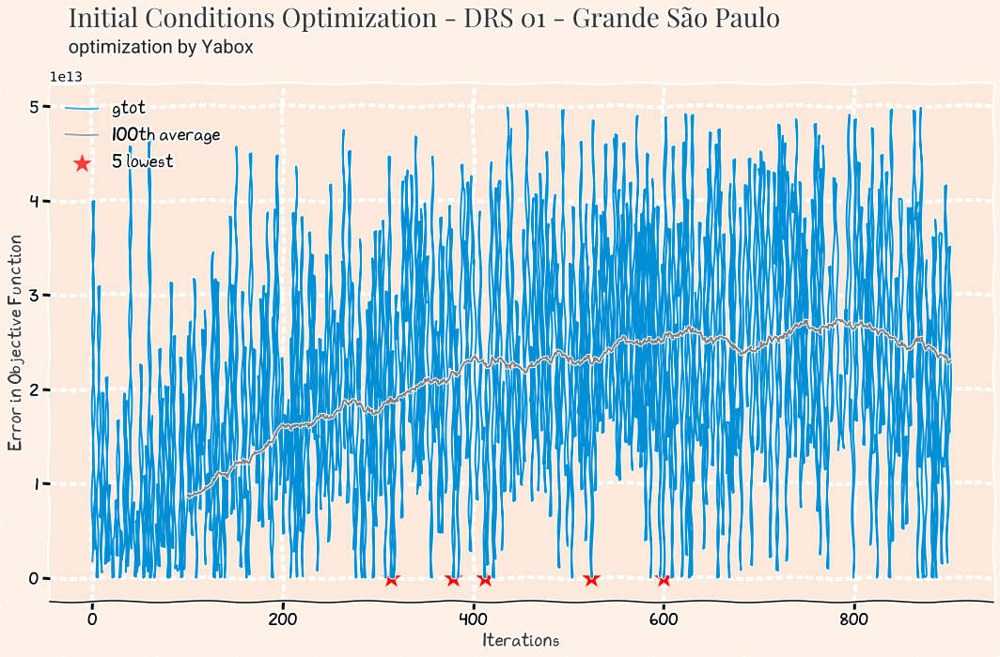

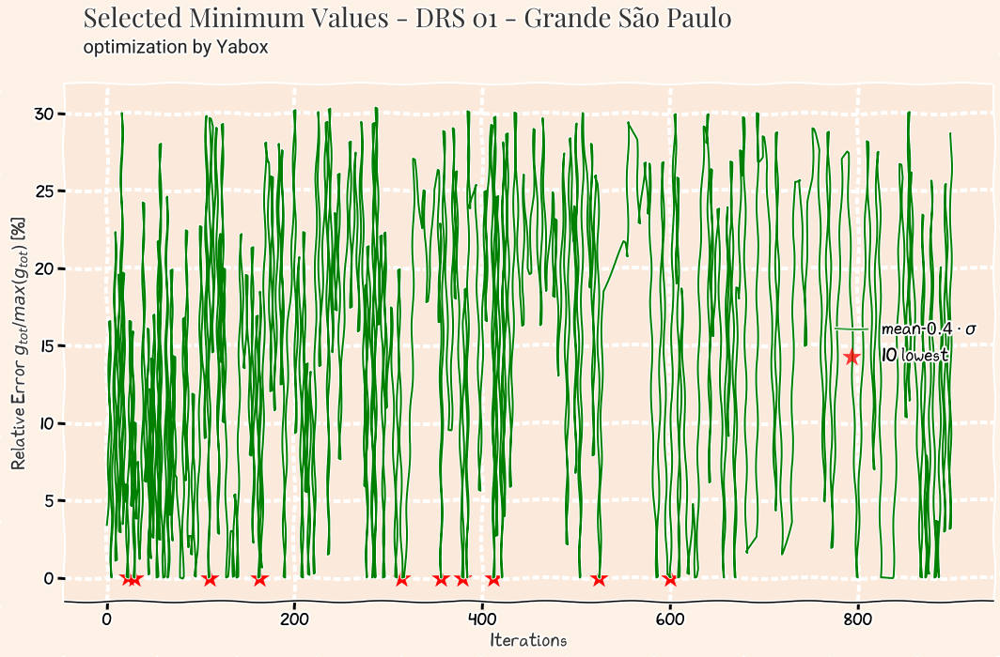

# Results for DRS 02 - Araçatuba District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
777,51586.51849,2020-03-30,21,219623,62,4,0.4729,0.0083


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
777,51586.518490,2020-03-30,21,219623,62,4,0.4729,0.0083
696,57257.674286,2020-03-30,64,227864,59,9,0.4484,0.0231
837,58240.116939,2020-04-02,28,208235,97,16,0.4217,0.0049
1097,60772.529849,2020-04-01,10,212928,242,11,0.4166,0.0218
898,61434.898782,2020-03-31,69,206594,149,55,0.5934,0.0071


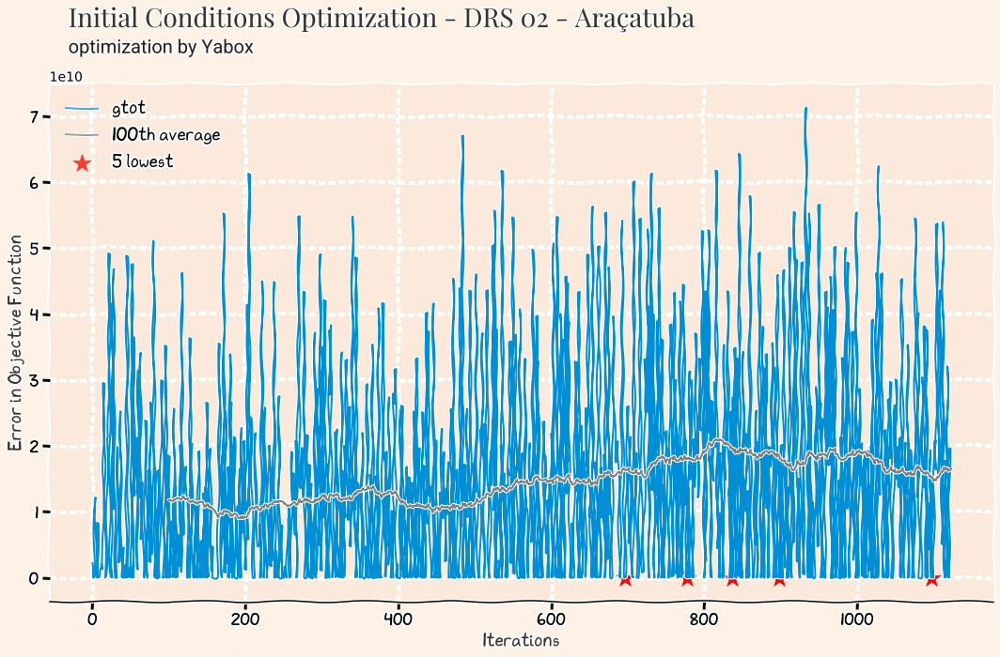

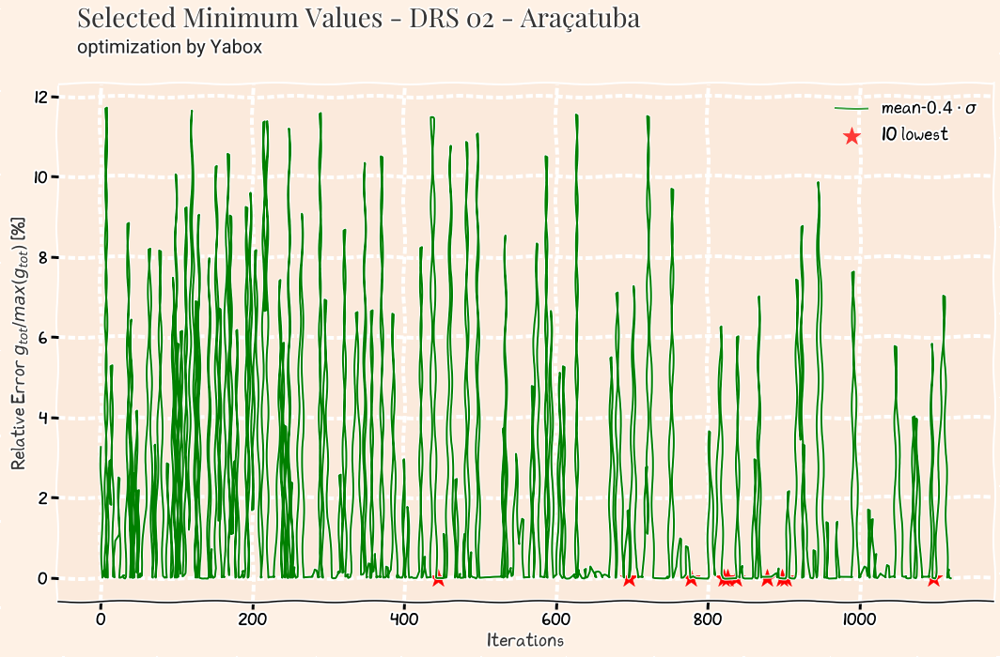

# Results for DRS 03 - Araraquara District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
576,100742.694719,2020-04-01,56,208565,79,66,0.507,0.0108


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
576,100742.694719,2020-04-01,56,208565,79,66,0.5070,0.0108
611,110467.090115,2020-04-01,31,306740,175,65,0.5837,0.0315
637,117876.637686,2020-03-31,71,304142,69,60,0.5382,0.0383
737,123514.853930,2020-03-31,52,258573,105,44,0.4043,0.0448
434,136686.964843,2020-04-02,135,199959,77,62,0.5066,0.0256


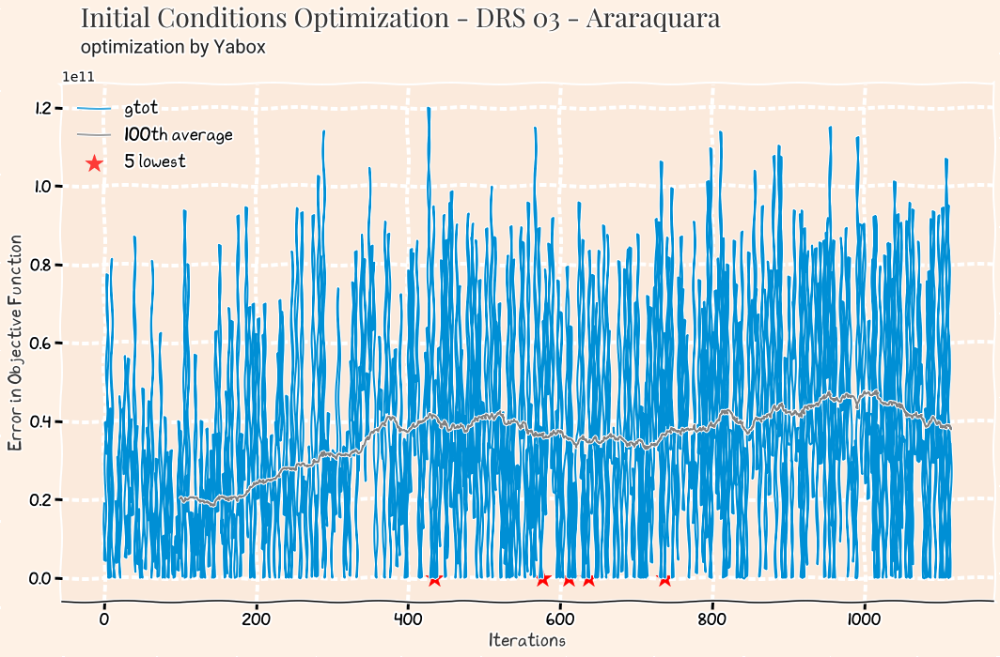

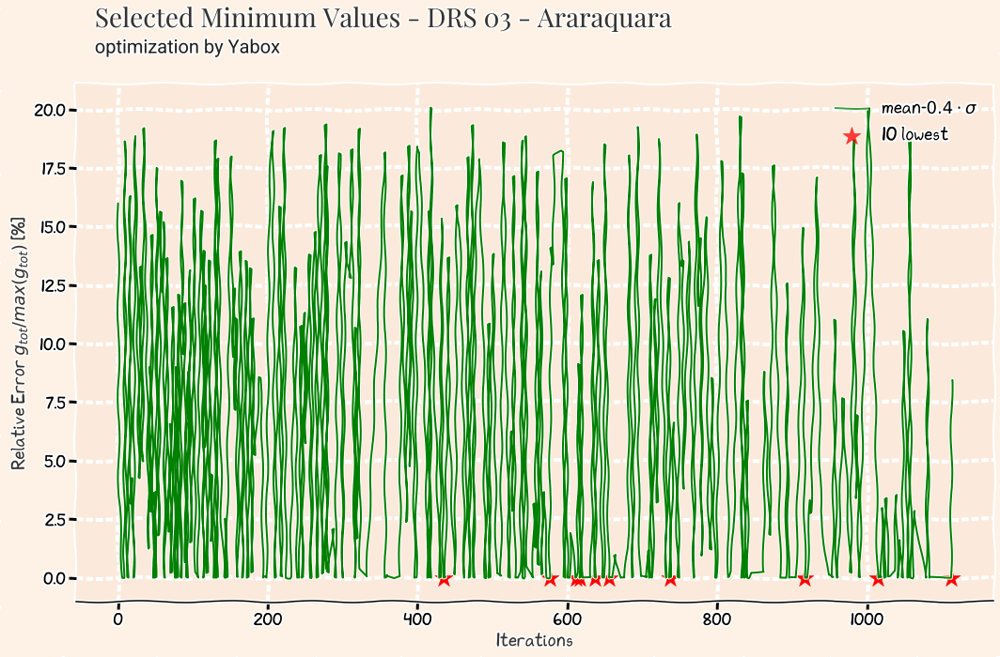

# Results for DRS 04 - Baixada Santista District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
804,1.053235e+06,2020-04-02,2,538769,198,34,0.5412,0.0017


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
804,1.053235e+06,2020-04-02,2,538769,198,34,0.5412,0.0017
355,1.792207e+06,2020-03-31,119,377732,33,96,0.5263,0.0070
129,3.931482e+06,2020-03-30,75,213272,109,60,0.4175,0.0131
649,4.985512e+06,2020-03-30,19,552882,75,17,0.4913,0.0053
78,5.792600e+06,2020-03-30,92,416302,6,27,0.4159,0.0063


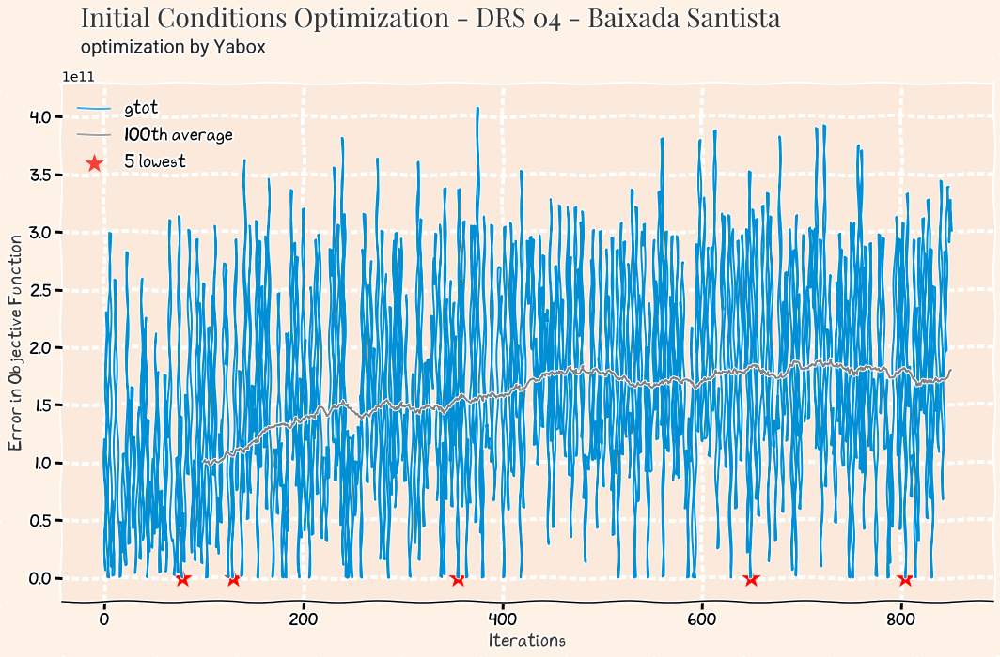

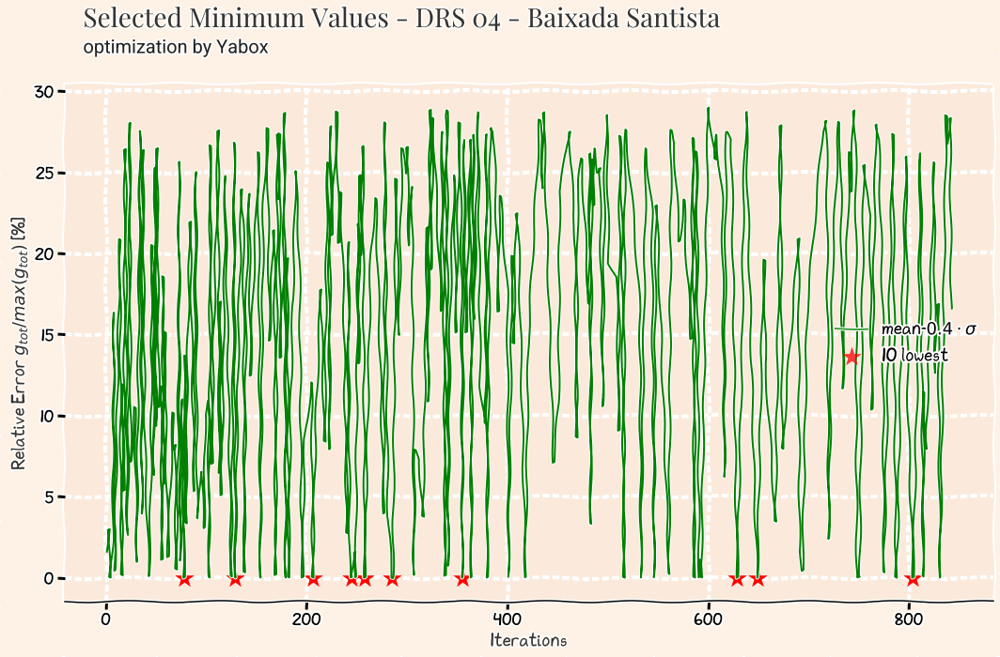

# Results for DRS 05 - Barretos District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
720,10589.003418,2020-04-01,15,108081,94,52,0.4928,0.0332


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
720,10589.003418,2020-04-01,15,108081,94,52,0.4928,0.0332
1146,37990.451650,2020-03-30,29,126850,40,13,0.5693,0.0016
460,41664.333649,2020-03-30,62,111905,41,18,0.5285,0.0421
915,41918.707003,2020-03-31,123,73937,35,87,0.4391,0.0423
1108,44621.692121,2020-04-01,99,115401,4,7,0.4980,0.0057


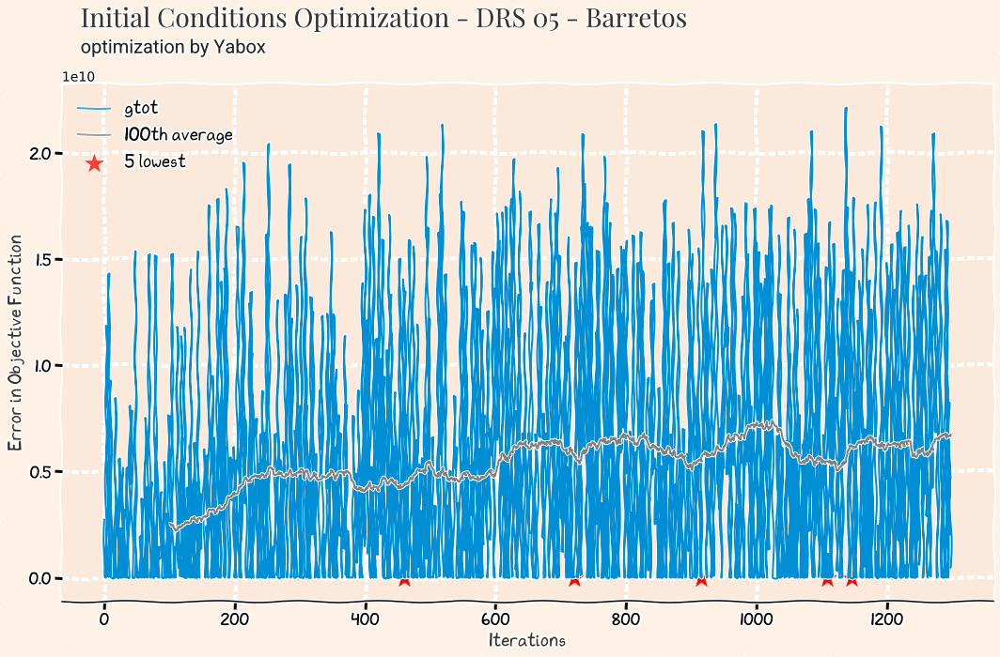

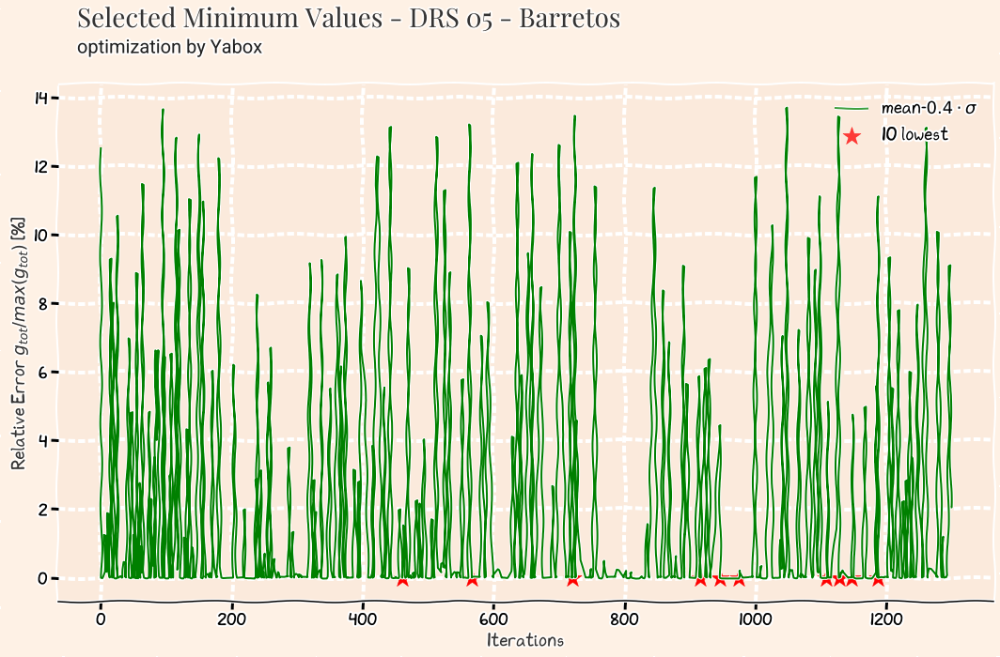

# Results for DRS 06 - Bauru District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
158,444088.986764,2020-04-01,40,265879,144,50,0.49,0.0093


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
158,444088.986764,2020-04-01,40,265879,144,50,0.4900,0.0093
702,449735.135395,2020-03-31,59,509561,129,67,0.5914,0.0304
573,502424.981946,2020-03-31,85,518900,131,70,0.5713,0.0021
372,599452.199067,2020-04-01,22,417718,18,89,0.4686,0.0034
378,605174.084266,2020-03-31,138,440485,125,81,0.4867,0.0135


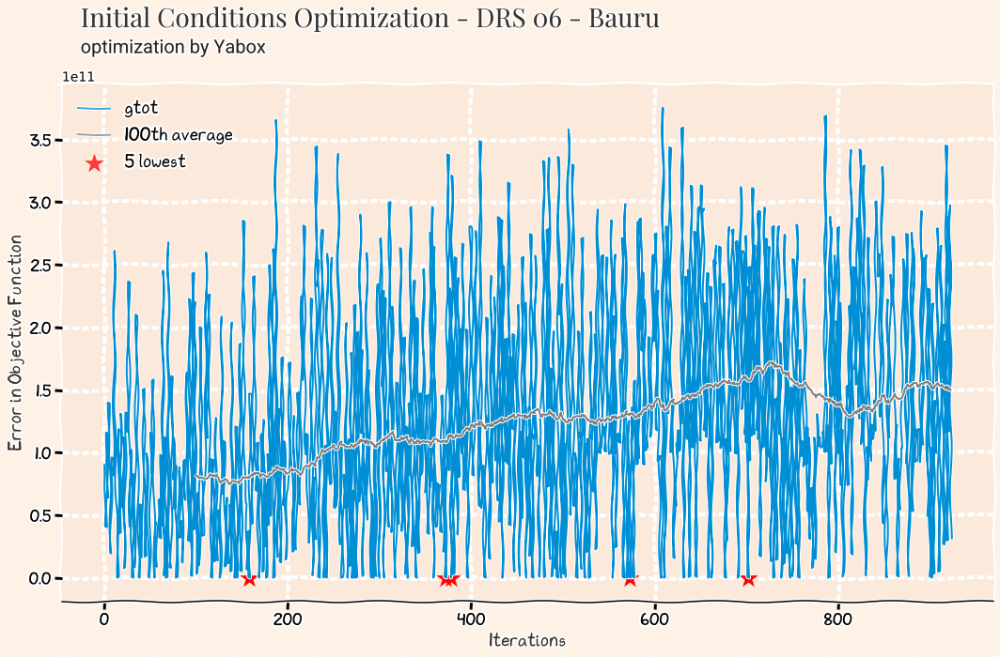

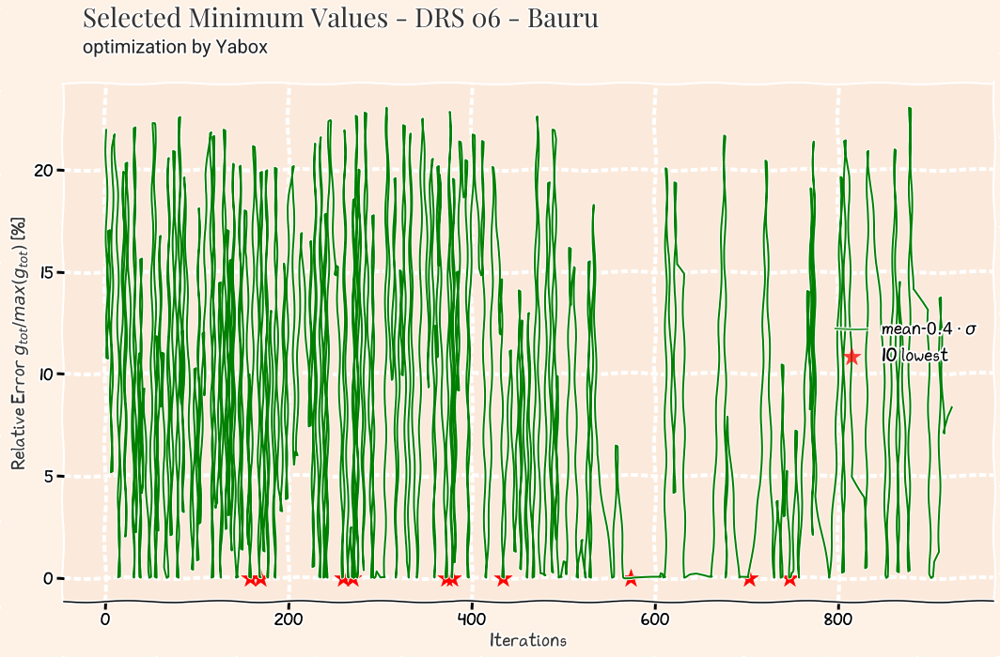

# Results for DRS 07 - Campinas District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
494,4.533494e+06,2020-03-30,38,1319214,178,68,0.521,0.0115


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
494,4.533494e+06,2020-03-30,38,1319214,178,68,0.5210,0.0115
546,4.775669e+06,2020-03-30,104,1315608,19,51,0.4482,0.0019
522,4.790152e+06,2020-03-31,30,1276077,165,72,0.4267,0.0186
495,4.884002e+06,2020-04-01,38,1310127,185,11,0.4039,0.0202
118,9.559465e+06,2020-03-31,21,1390133,137,20,0.4372,0.0043


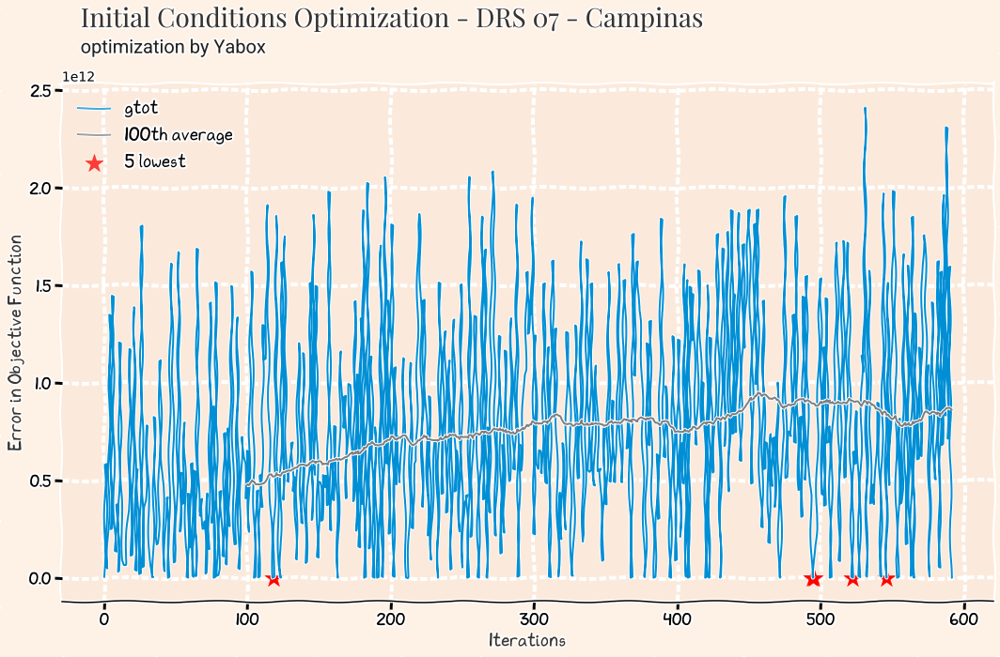

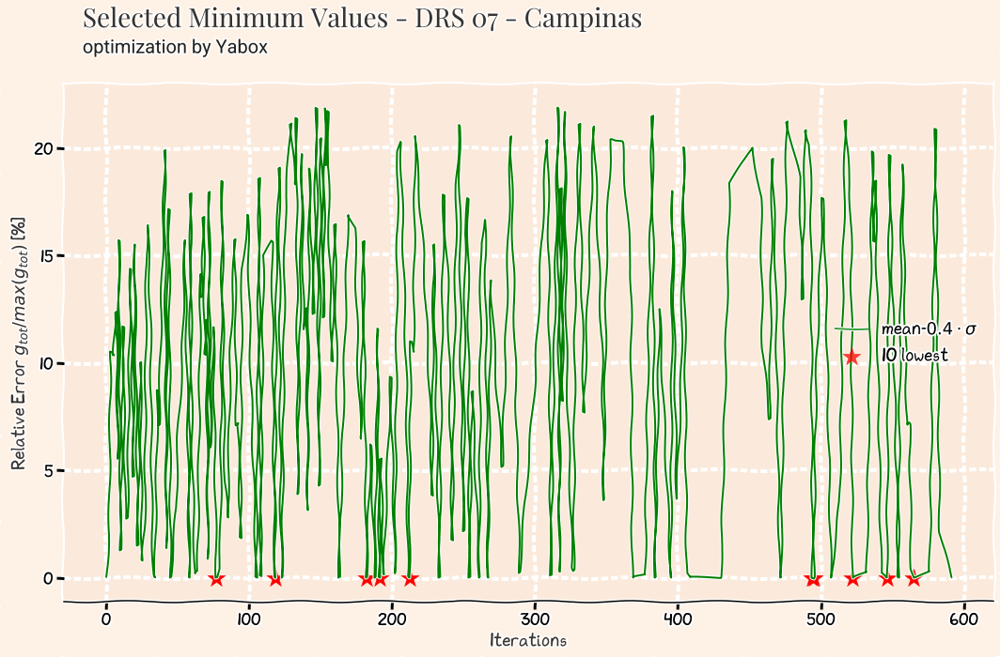

# Results for DRS 08 - Franca District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
13,10020.399534,2020-03-31,140,60912,80,78,0.4564,0.0301


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
13,10020.399534,2020-03-31,140,60912,80,78,0.4564,0.0301
1411,10377.137044,2020-03-31,125,196487,19,25,0.5250,0.0135
808,18974.172038,2020-03-31,5,201782,86,43,0.5108,0.0311
1134,19132.492010,2020-03-30,8,192001,15,36,0.4542,0.0216
1442,19363.920445,2020-04-01,55,200575,87,73,0.4402,0.0384


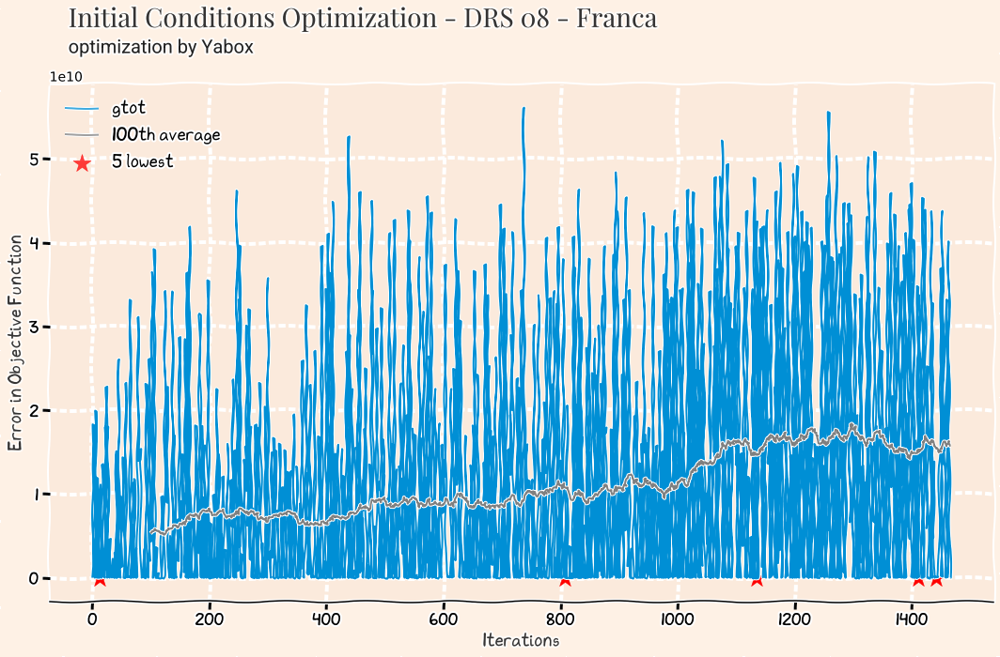

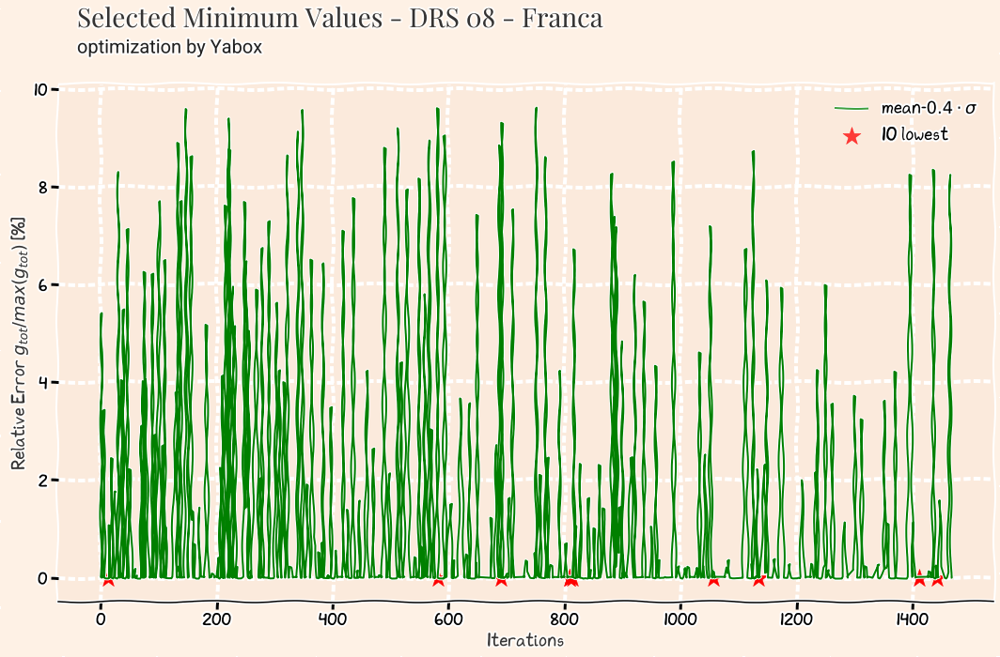

# Results for DRS 09 - Marília District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
691,39083.720911,2020-04-01,83,324404,197,59,0.5232,0.0186


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
691,39083.720911,2020-04-01,83,324404,197,59,0.5232,0.0186
918,55479.219324,2020-04-02,40,182023,52,22,0.5436,0.0083
1125,59615.571054,2020-04-01,110,293020,30,3,0.5142,0.0181
420,64353.852295,2020-03-30,45,279741,66,24,0.5227,0.0095
1128,64653.083302,2020-03-30,59,299331,27,59,0.5610,0.0018


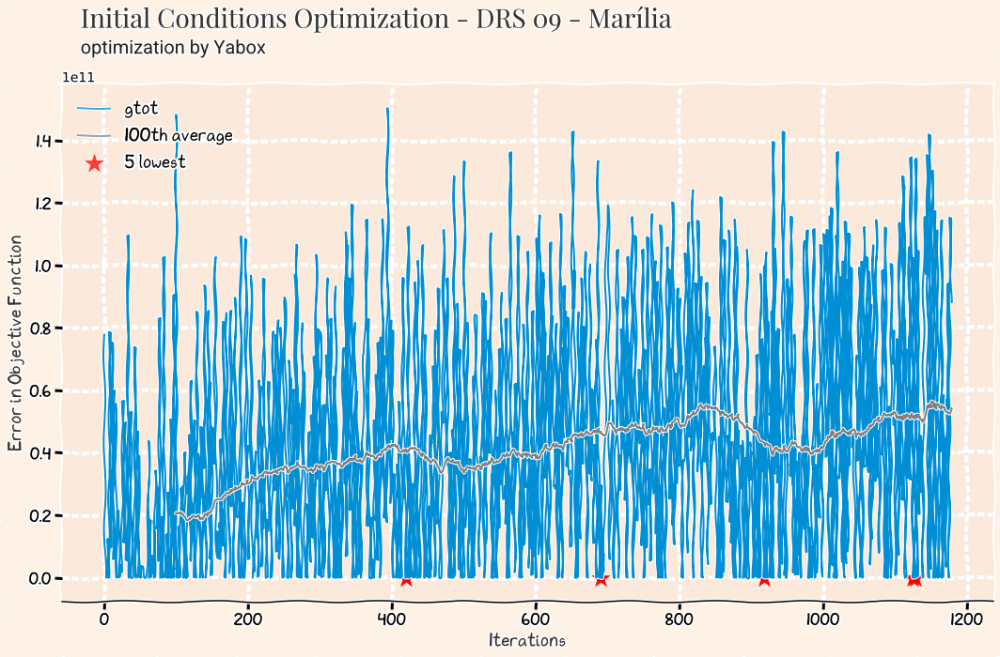

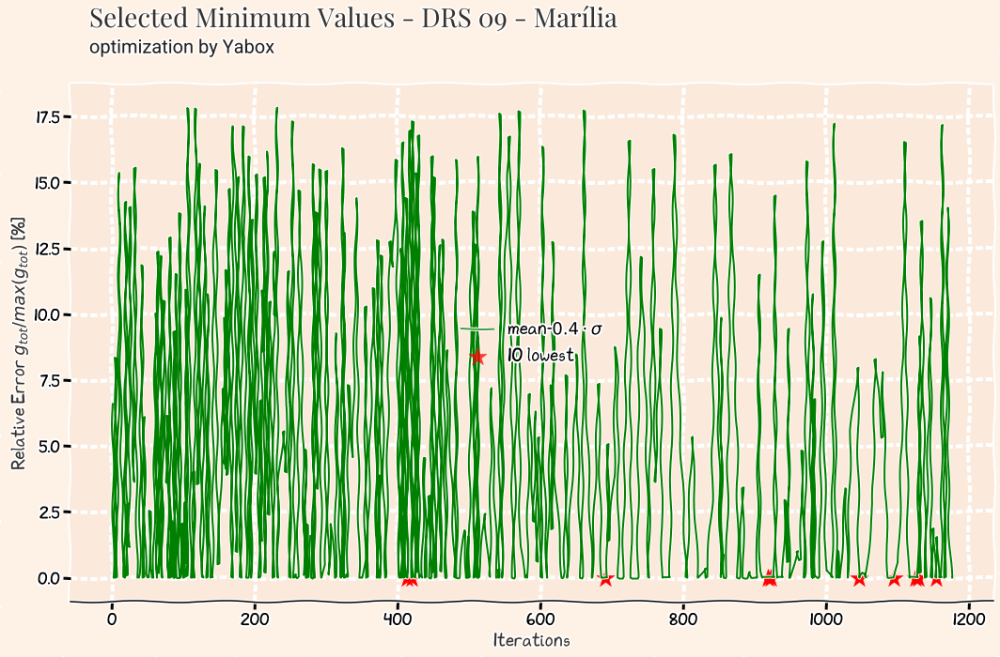

# Results for DRS 10 - Piracicaba District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
59,372709.278422,2020-04-01,149,301293,248,84,0.4061,0.0234


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
59,372709.278422,2020-04-01,149,301293,248,84,0.4061,0.0234
777,548408.579614,2020-04-02,73,454531,116,58,0.4008,0.0323
505,556258.799681,2020-04-01,61,452365,195,97,0.5511,0.0189
877,561265.796575,2020-03-31,29,439015,95,81,0.4652,0.0094
624,578552.042338,2020-04-02,142,450458,120,85,0.4729,0.0093


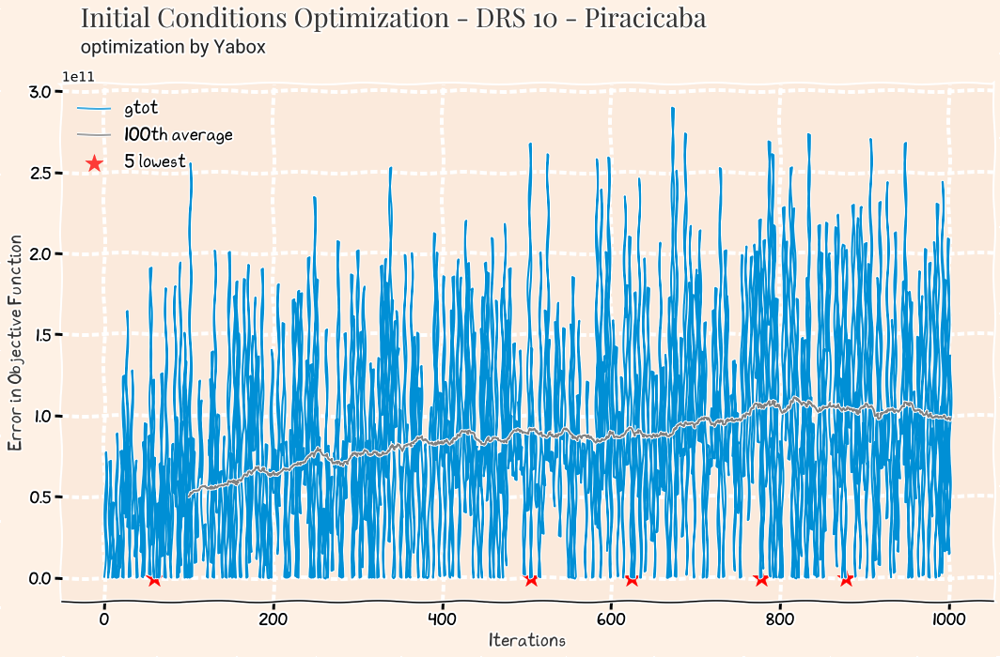

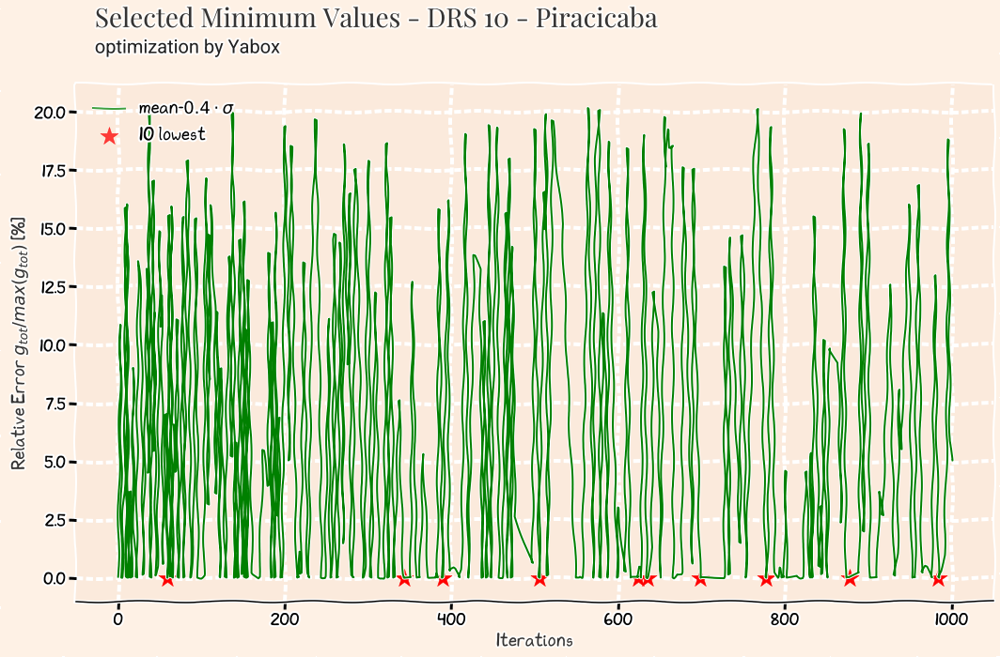

# Results for DRS 11 - Presidente Prudente District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
226,5388.266819,2020-03-31,72,128500,137,26,0.5656,0.0418


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
226,5388.266819,2020-03-31,72,128500,137,26,0.5656,0.0418
1108,23664.894215,2020-03-31,106,178977,27,80,0.5963,0.0150
579,27517.610971,2020-03-31,121,212466,47,8,0.5820,0.0432
836,31287.476688,2020-04-01,94,198169,102,3,0.5635,0.0145
1103,32859.185091,2020-04-01,89,221336,115,1,0.5266,0.0181


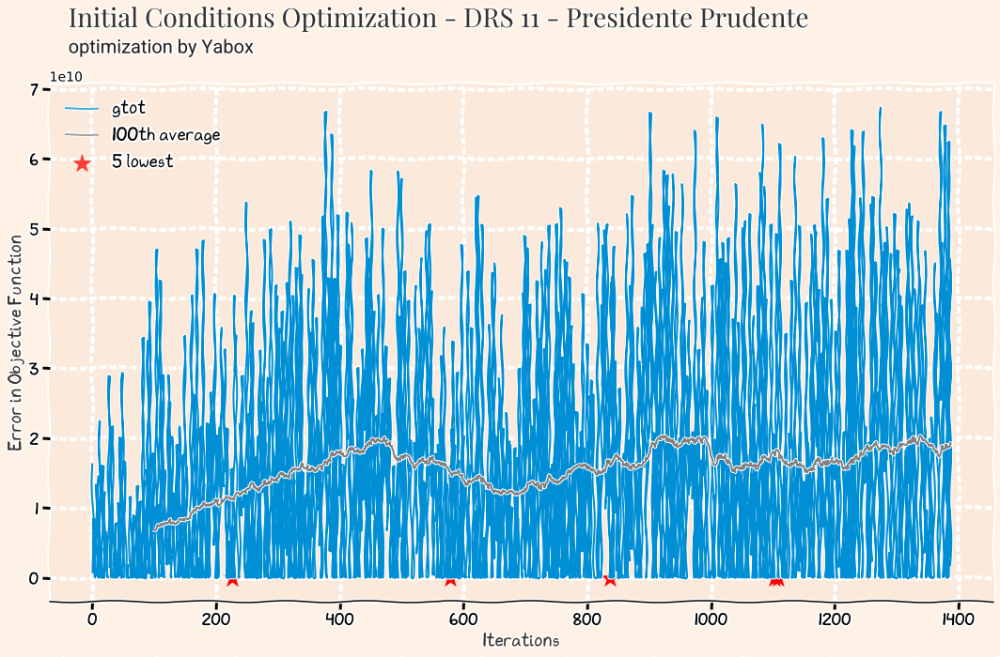

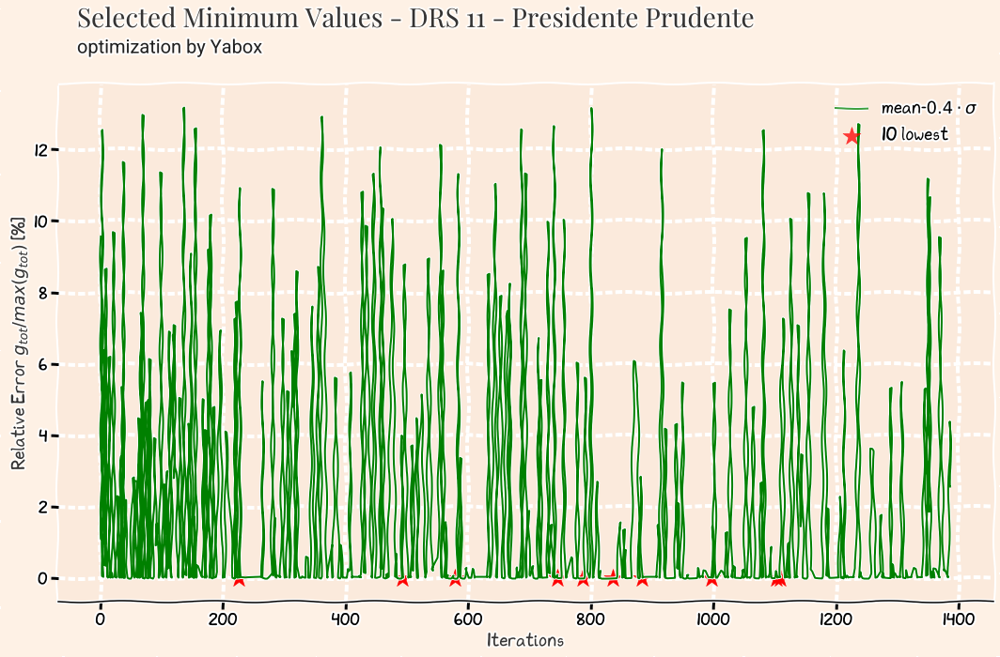

# Results for DRS 12 - Registro District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
611,16323.040626,2020-03-31,57,67324,163,95,0.5458,0.0227


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
611,16323.040626,2020-03-31,57,67324,163,95,0.5458,0.0227
865,39348.731554,2020-03-30,32,77324,26,36,0.4822,0.0024
570,39418.937652,2020-03-31,49,75525,210,8,0.5540,0.0367
556,42353.566295,2020-04-01,18,64183,179,85,0.5899,0.0405
894,42690.655280,2020-04-01,16,72868,211,25,0.4943,0.0329


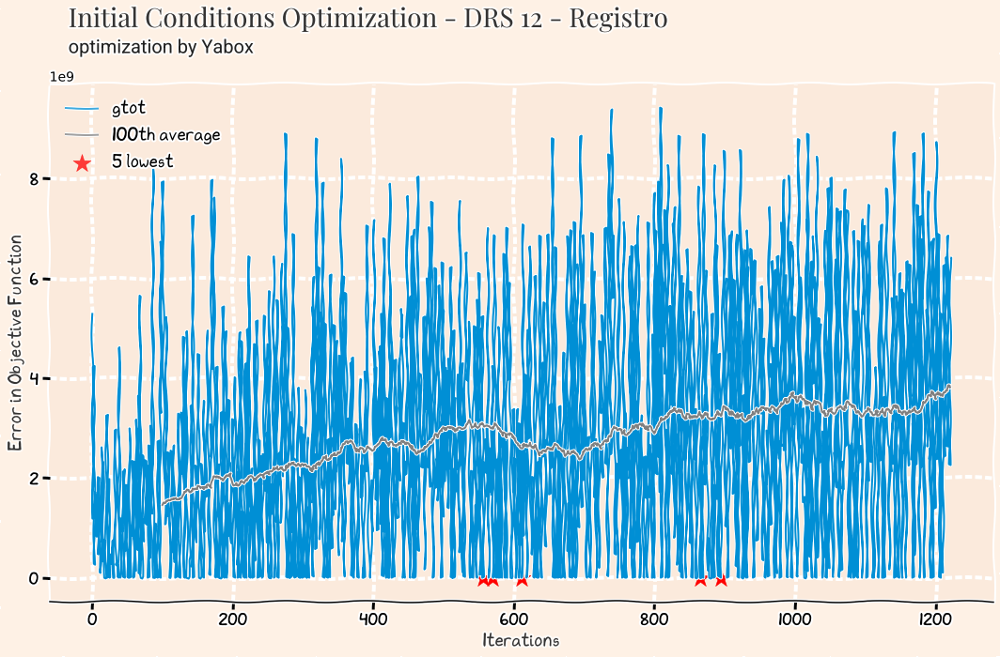

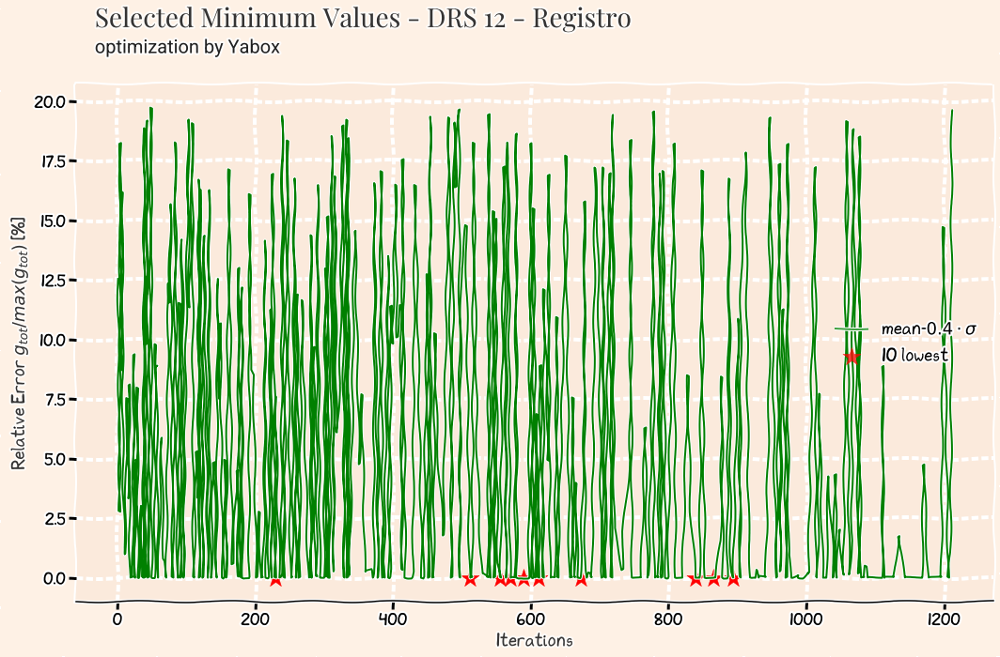

# Results for DRS 13 - Ribeirão Preto District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
873,401949.495234,2020-03-30,5,434050,95,71,0.4783,0.0244


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
873,401949.495234,2020-03-30,5,434050,95,71,0.4783,0.0244
488,418360.736490,2020-03-31,32,394250,122,73,0.4953,0.0277
903,445087.494301,2020-04-01,10,426548,239,52,0.4471,0.0319
758,446719.699942,2020-04-02,17,395559,164,88,0.4918,0.0231
419,509882.190955,2020-04-02,70,363131,13,59,0.4848,0.0138


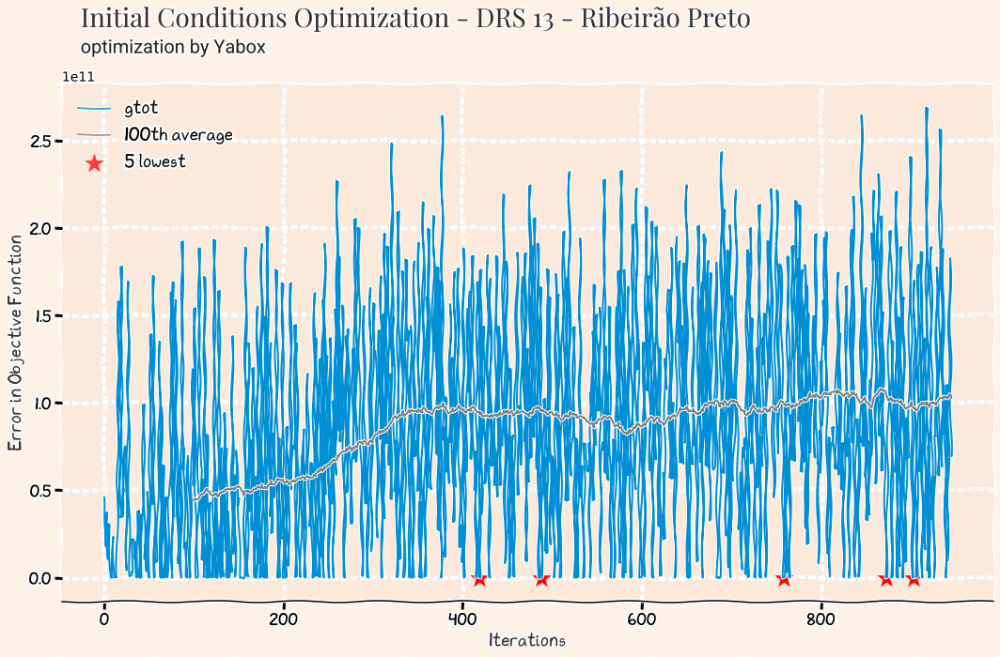

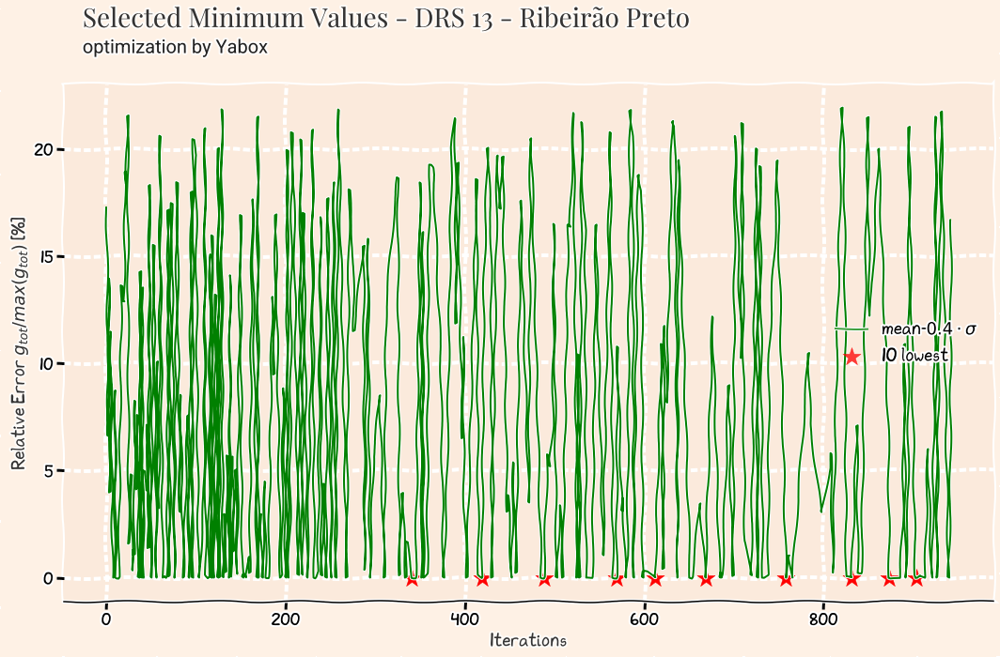

# Results for DRS 14 - São João da Boa Vista District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
391,7477.434434,2020-03-30,141,171957,95,62,0.4178,0.0113


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
391,7477.434434,2020-03-30,141,171957,95,62,0.4178,0.0113
1222,8362.238076,2020-04-02,108,195393,69,74,0.5203,0.0037
1224,16118.624040,2020-04-01,45,54578,77,67,0.4771,0.0336
1164,43732.399430,2020-03-31,45,237513,14,2,0.4069,0.0113
646,46839.471140,2020-04-01,33,223866,111,24,0.5258,0.0440


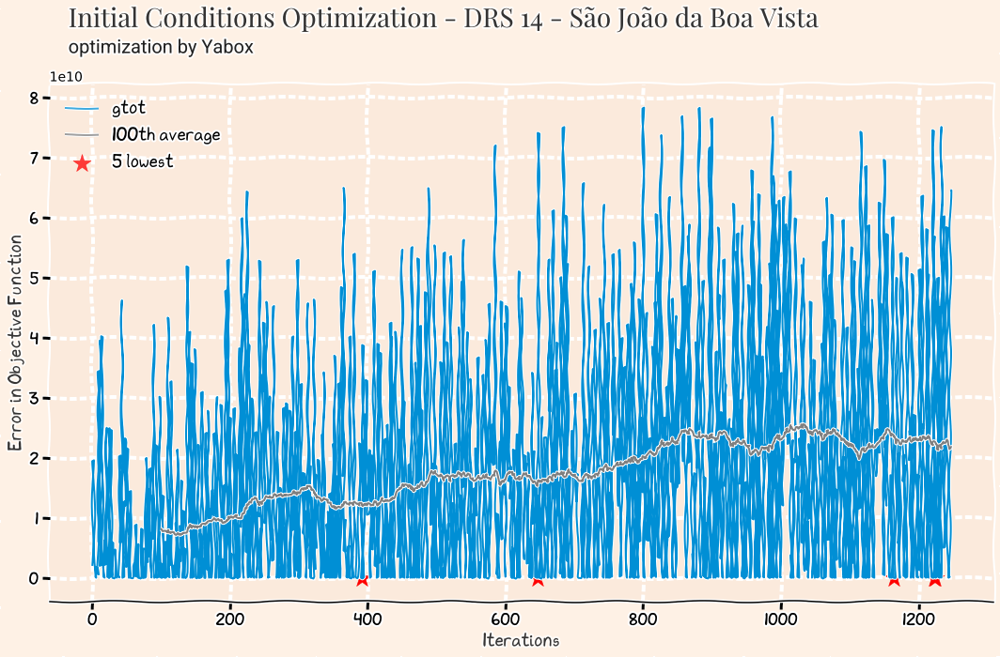

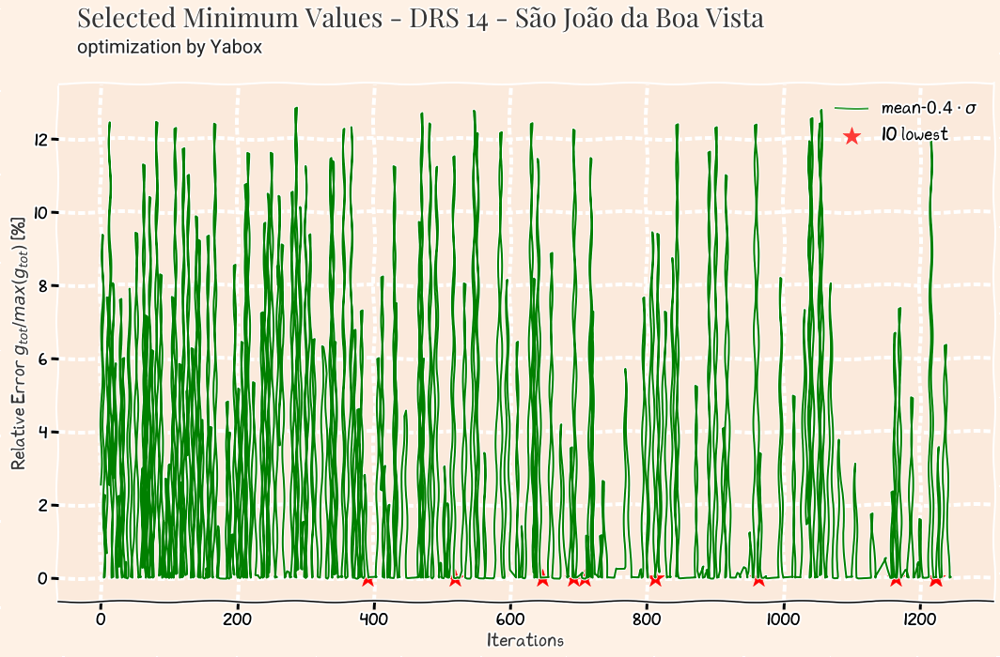

# Results for DRS 15 - São José do Rio Preto District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
183,644302.684861,2020-03-30,109,334399,54,23,0.4179,0.0064


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
183,6.443027e+05,2020-03-30,109,334399,54,23,0.4179,0.0064
354,7.452098e+05,2020-04-01,71,466956,88,16,0.5102,0.0270
539,7.586491e+05,2020-03-30,14,449903,216,25,0.5131,0.0125
830,8.459333e+05,2020-03-31,74,472865,191,88,0.4428,0.0144
343,1.026950e+06,2020-03-30,113,414655,57,24,0.5786,0.0018


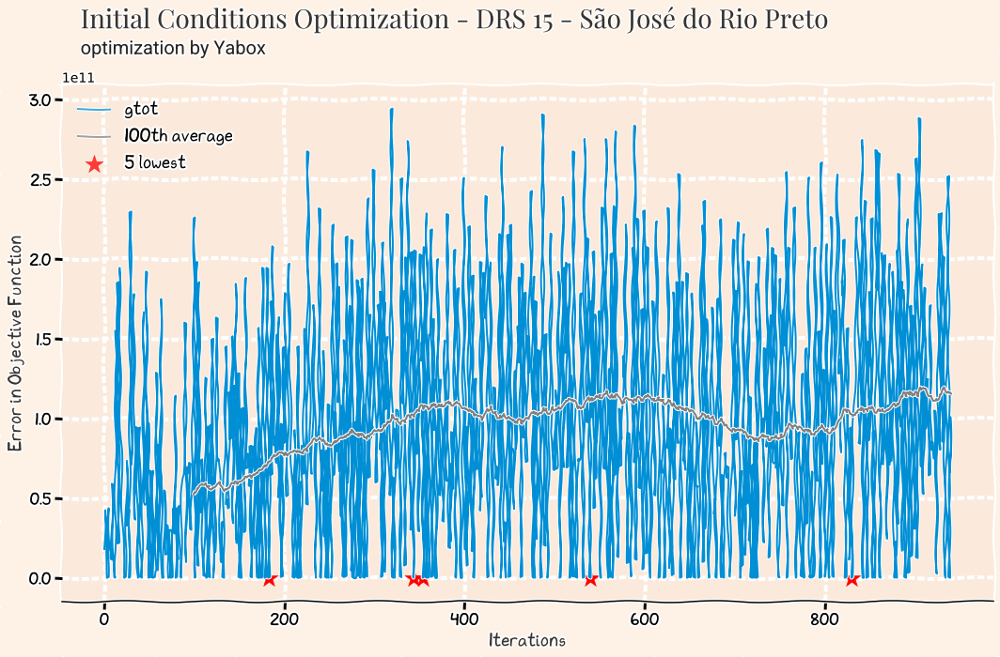

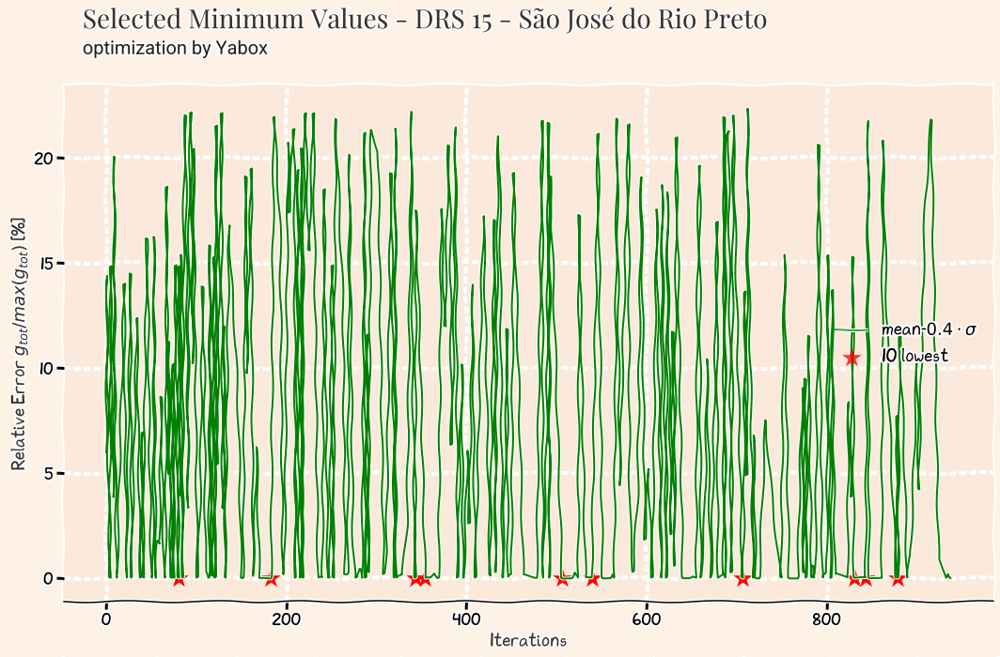

# Results for DRS 16 - Sorocaba District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
76,657666.479558,2020-04-02,72,471985,109,35,0.481,0.0084


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
76,6.576665e+05,2020-04-02,72,471985,109,35,0.4810,0.0084
318,8.459211e+05,2020-04-01,70,726344,243,3,0.5771,0.0351
619,9.274664e+05,2020-04-02,53,714501,83,27,0.5161,0.0107
445,9.653367e+05,2020-03-31,119,686425,143,13,0.5226,0.0321
397,1.152455e+06,2020-03-31,125,271162,115,10,0.4683,0.0333


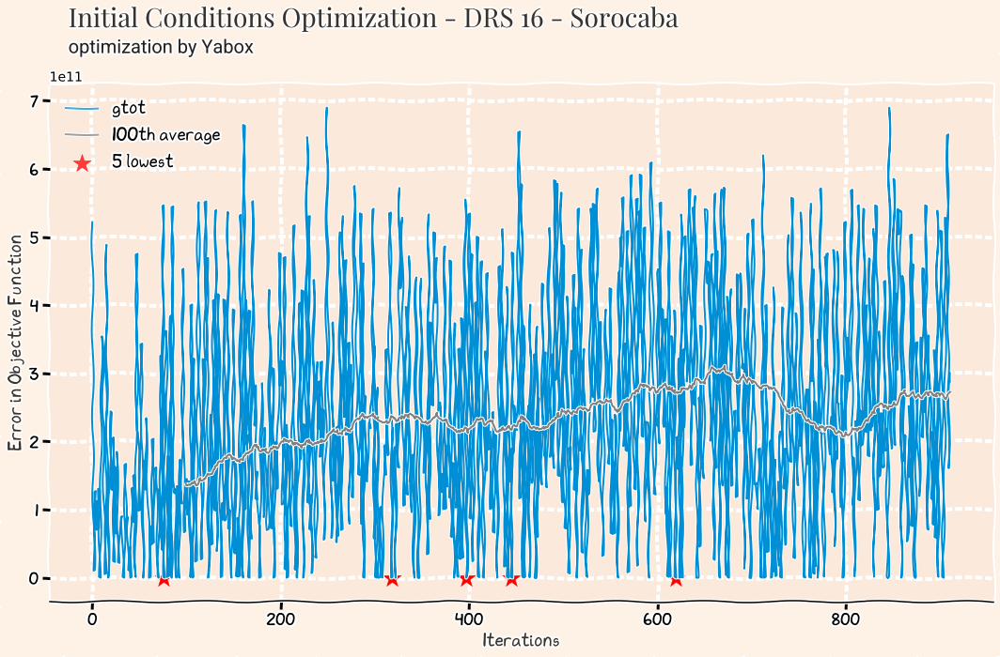

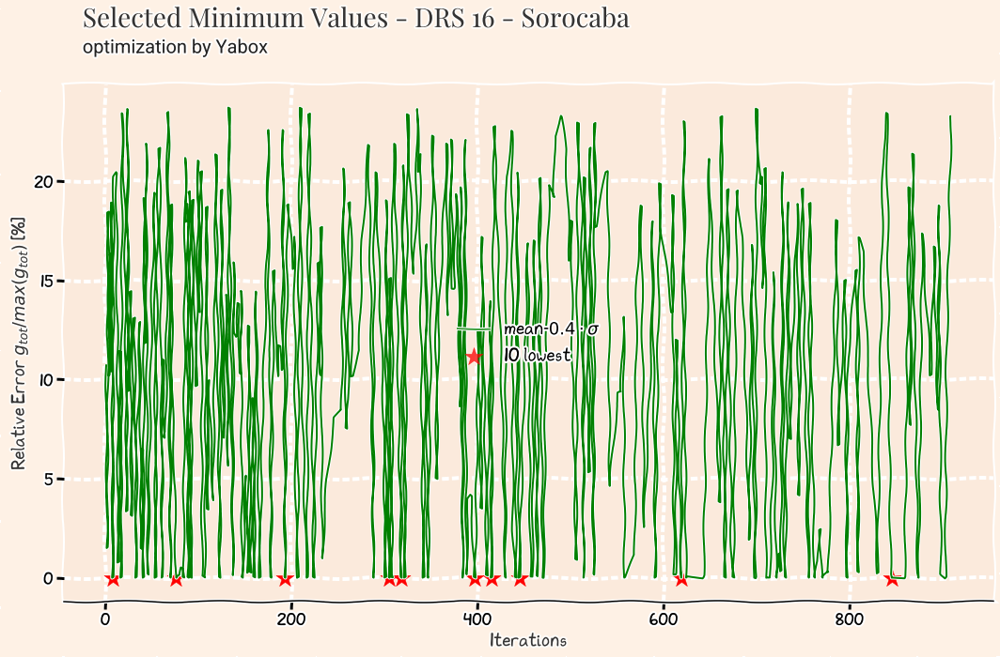

# Results for DRS 17 - Taubaté District Region

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
685,521044.723724,2020-04-02,70,727159,162,36,0.5571,0.0409


## 5 Lowest Results

,gtot,startdate,startNcases,s0,i0,d0,wcases,wrec
685,521044.723724,2020-04-02,70,727159,162,36,0.5571,0.0409
714,566653.258832,2020-04-02,120,590741,122,52,0.5707,0.0247
771,584665.302846,2020-03-31,20,701932,17,25,0.4336,0.0075
417,603242.054989,2020-04-02,103,669884,187,38,0.5351,0.0021
332,653802.978636,2020-03-31,61,714335,181,64,0.4309,0.0161


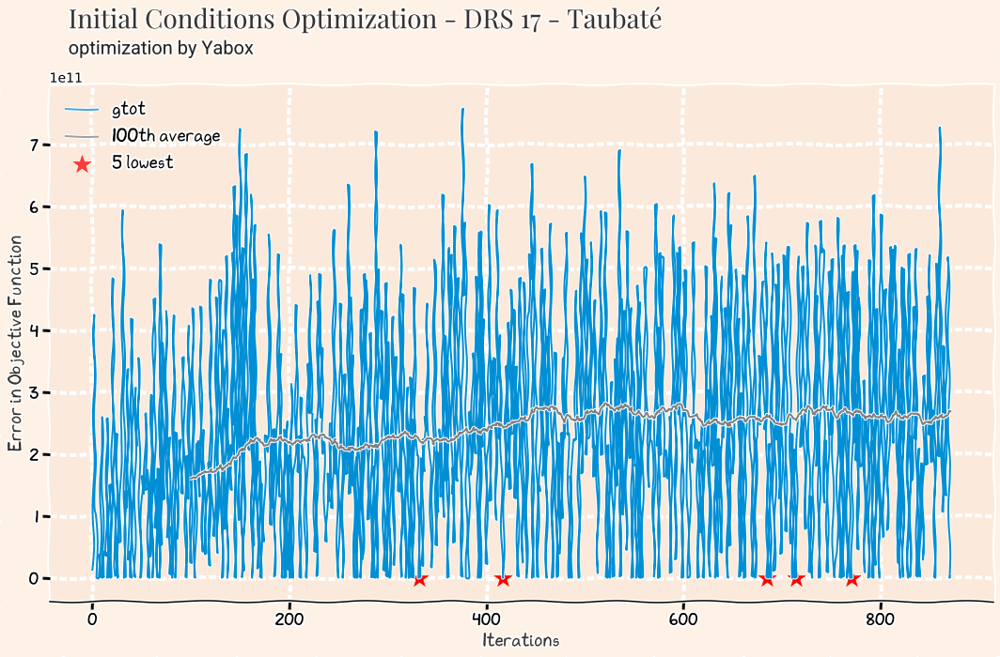

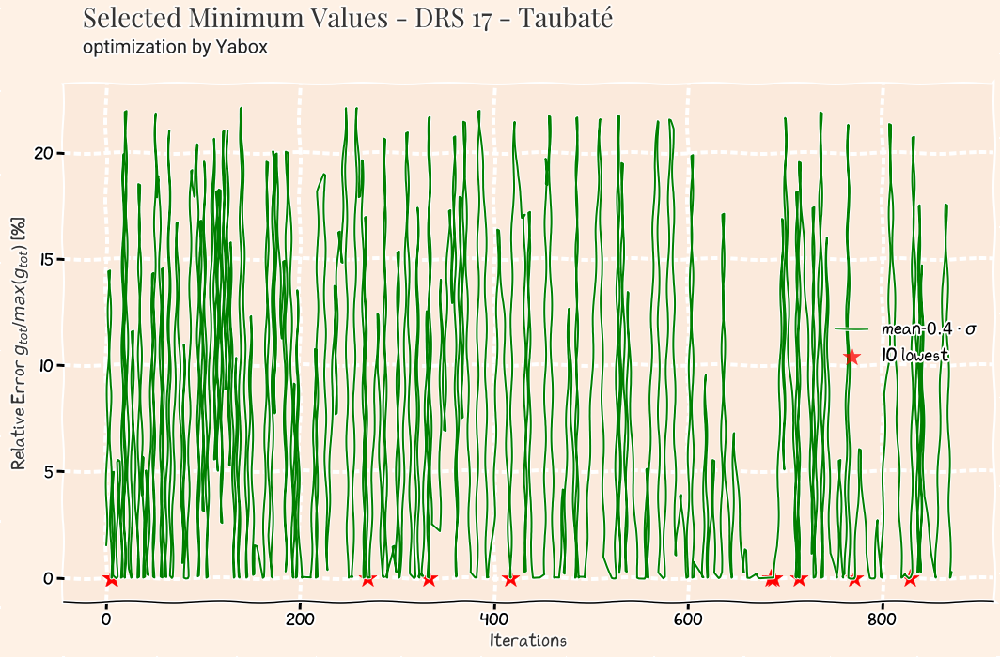

In [12]:
ggtot=[]
for districtRegion in DRS:
    versionStr=str(version)
    dateparse = lambda x: datetime.strptime(x, ' %Y-%m-%d')
    histOptAll= pd.read_table('./results/history_'+districtRegion+versionStr+'.csv', sep=",", \
                                index_col=0, header=None, parse_dates=[3], date_parser=dateparse,
        names = ["districtRegion","gtot",\
            "s0","startdate","i0","d0","startNcases","wcases","wrec"])
    histOptAll = histOptAll[['gtot', 'startdate','startNcases','s0',"i0","d0","wcases","wrec"]]
        
    #clean data
    histOptAll=histOptAll.dropna(how='all')
    histOptAll.gtot=pd.to_numeric(histOptAll.gtot, errors='coerce')
    histOptAll = histOptAll.reset_index(drop=True)
    histOptAll = histOptAll[histOptAll.loc[:,"gtot"]<0.5e14]
    
    #format integers and decimal places
#     histOptAll['gtot'] = histOptAll['gtot'].apply(lambda x: int(x+0.5))
    histOptAll['d0'] = histOptAll['d0'].apply(lambda x: int(x+0.5))
    histOptAll['startNcases'] = histOptAll['startNcases'].apply(lambda x: int(x+0.5))
    histOptAll['s0'] = histOptAll['s0'].apply(lambda x: int(x+0.5))
    histOptAll['i0'] = histOptAll['i0'].apply(lambda x: int(x+0.5))
    histOptAll['wcases'] = histOptAll['wcases'].apply(lambda x: round(x,4))
    histOptAll['wrec'] = histOptAll['wrec'].apply(lambda x: round(x,4))
    
    #print optimum parameters
    histOpt=histOptAll[histOptAll.gtot==min(histOptAll.gtot)]
    histOpt=histOpt.head(1)
    display(Markdown("# Results for "+districtRegion+" District Region"))
    display(histOpt.iloc[:,0:8])
    histOpt.to_csv("data/vars_optimized_"+districtRegion+model+"HistMin.csv", sep=","
                   , index=False)
        
    #current parameters
    query = dfparam.query('DRS == "{}"'.format(districtRegion)).reset_index()
    parameters = np.array(query.iloc[:, 2:])[0]
    if len(parameters)>12:
        date,predict_range,s0,e0,a0,i0,r0,d0,startNCases,ratio,wcases,wrec,popEst = parameters
    else:
        date,predict_range,s0,e0,a0,i0,r0,d0,startNCases,ratio,wcases,wrec = parameters
    
    #query parameters
    j = query['index'].values[0]
    
    #define s0, i0 and d0
    dfparam.at[j, "s0"] = histOpt.s0
    dfparam['s0'] = dfparam['s0'].astype(int)
    dfparam.at[j, "i0"] = histOpt.i0
    dfparam['i0'] = dfparam['i0'].astype(int)
    dfparam.at[j, "d0"] = histOpt.d0
    dfparam.at[j, "START"] = histOpt.startNcases
    
    dfparam['a0'] = dfparam['a0'].astype(int)
    dfparam['e0'] = dfparam['e0'].astype(int)
    dfparam['r0'] = dfparam['r0'].astype(int)
    dfparam['d0'] = dfparam['d0'].astype(int)
    #define Start N Cases
    dfparam['START'] = dfparam['START'].astype(int)
    #define date, wcases, wrec
    dfparam.at[j, "start-date"] = histOpt.startdate.dt.strftime('%Y-%m-%d').values[0]
    dfparam.at[j, "WCASES"] = histOpt.wcases
    dfparam.at[j, "WREC"] = histOpt.wrec
    
    dfparam.r0=0
    
    #save new parameters
    dfparam.to_csv("data/param_optimized_"+model+"_HistMin.csv", sep=",", index=False)
    
    ggtot.append(histOpt.gtot.values[0])
    
    #prepare plotting
    color_bg = '#FEF1E5'
    # lighter_highlight = '#FAE6E1'
    darker_highlight = '#FBEADC'
    plt.rc('font', size=14)
    
    with plt.xkcd():
        fig, ax = plt.subplots(figsize=(15, 10),facecolor=color_bg)
        ax.patch.set_facecolor(darker_highlight)
        
        #fonts for the thicks
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontproperties(comic_font)
            label.set_fontsize(16) # Size here overrides font_prop
        
        #labels for x and y axis
        plt.xlabel("Iterations", fontproperties=comic_font, alpha = .75)
        plt.ylabel("Error in Objective Function", fontproperties=comic_font, alpha = .75)
        
        # Hide the left, right and top spines
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)

        #PLOTTING itself
        x=histOptAll.index
        y=histOptAll.gtot
        ax.plot(x,y, label="gtot")
        display(Markdown("## 5 Lowest Results"))
        histMin=histOptAll.nsmallest(5, ['gtot']).sort_values('gtot').iloc[:,0:8]
        display(histMin)

        ax.scatter(histMin.index, histMin.gtot,label="5 lowest",c='red',marker='*',s=400)
        histOptAll.rolling(100).mean()['gtot'].plot(label="100th average",c='gray')

        # Adding a title and a subtitle
        plt.text(x = 0.02, y = 1.11, s = "Initial Conditions Optimization - "+districtRegion,
                    fontsize = 34, weight = 'bold', alpha = .75,transform=ax.transAxes, 
                    fontproperties=heading_font)
        plt.text(x = 0.02, y = 1.06,
                    s = "optimization by "+model,
                    fontsize = 26, alpha = .85,transform=ax.transAxes, 
                    fontproperties=subtitle_font)
        
        leg=ax.legend(frameon=False,prop=comic_font,fontsize=16)
        for lh in leg.legendHandles: 
            lh.set_alpha(0.75)
        ax.grid(True, linestyle='--', linewidth='2', color='white',alpha=0.1)

        fig.tight_layout()
        strFile ='./results/convergence_'+districtRegion+versionStr+'.png'
        fig.savefig(strFile, facecolor=fig.get_facecolor(), edgecolor=fig.get_edgecolor())
        plt.show()
        
        fig, ax = plt.subplots(figsize=(15, 10),facecolor=color_bg)
        ax.patch.set_facecolor(darker_highlight)
        
        # Hide the left, right and top spines
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        
        #fonts for the thicks
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontproperties(comic_font)
            label.set_fontsize(16) # Size here overrides font_prop
        
        histMin=histOptAll.iloc[:,0:8]
        histMin.sort_index(inplace=True)
        
        histMin['error']=histMin.gtot/histMin.gtot.max()*100
        x=histMin.index[histMin.error<histMin.error.mean()-0.4*histMin.error.std()]
        y=histMin.error[histMin.error<histMin.error.mean()-0.4*histMin.error.std()]
                
        ax.plot(x, y, label="mean-$0.4 \cdot \sigma$",c='green')
        histMin2=histMin.nsmallest(10, ['gtot']).sort_values('gtot')
        ax.scatter(histMin2.index, histMin2.gtot/histMin.gtot.max()*100,
                   label="10 lowest",c='red',marker='*',s=400)
        
        #labels for x and y axis
        plt.xlabel("Iterations", fontproperties=comic_font, alpha = .75)
        plt.ylabel("Relative Error $g_{tot}/max(g_{tot})$ [%]", 
                   fontproperties=comic_font, alpha = .75)

        # Adding a title and a subtitle
        plt.text(x = 0.02, y = 1.11, s = "Selected Minimum Values - "+districtRegion,
                    fontsize = 34, weight = 'bold', alpha = .75,transform=ax.transAxes, 
                    fontproperties=heading_font)
        plt.text(x = 0.02, y = 1.06,
                    s = "optimization by "+model,
                    fontsize = 26, alpha = .85,transform=ax.transAxes, 
                    fontproperties=subtitle_font)
        
        leg=ax.legend(frameon=False,prop=comic_font,fontsize=16)
        for lh in leg.legendHandles: 
            lh.set_alpha(0.75)
        ax.grid(True, linestyle='--', linewidth='2', color='white',alpha=0.1)

        fig.tight_layout()
        strFile ='./results/minimumPoints_'+districtRegion+versionStr+'.png'
        fig.savefig(strFile, facecolor=fig.get_facecolor(), edgecolor=fig.get_edgecolor())
        plt.show()

In [13]:
display(Markdown("# Final Results for Initial Conditions"))
display(Markdown("## "+model+" optimization model"))

from IPython.display import HTML

dfparam["gtot"] = pd.Series(ggtot)
gtot_min=dfparam.gtot.min()
gtot_max=dfparam.gtot.max()
gtot_range=gtot_max-gtot_min
gtot_mean=dfparam.gtot.mean()
gtot_std=dfparam.gtot.std()

dfparam['gtot'] = dfparam['gtot'].astype(int)
dfparam['RATIO'] = dfparam['RATIO'].round(decimals=2)

gtot_high=(gtot_mean)/gtot_range
gtot_low=abs(gtot_mean-gtot_std)/gtot_range

s = dfparam.style.background_gradient(cmap='RdYlGn_r',
            axis=0,subset=['s0','i0','d0','gtot'],low=gtot_low/2.74,high=gtot_high/100)
display(s)

# Final Results for Initial Conditions

## Yabox optimization model

,DRS,start-date,prediction-range,s0,e0,a0,i0,r0,d0,START,RATIO,WCASES,WREC,gtot
0,DRS 01 - Grande São Paulo,2020-03-20,200,6094427,0,0,40,0,92,134,0.150000,0.504100,0.008100,9072323
1,DRS 02 - Araçatuba,2020-03-30,200,219623,0,0,62,0,4,21,0.150000,0.472900,0.008300,51586
2,DRS 03 - Araraquara,2020-04-01,200,208565,0,0,79,0,66,56,0.150000,0.507000,0.010800,100742
3,DRS 04 - Baixada Santista,2020-04-02,200,538769,0,0,198,0,34,2,0.150000,0.541200,0.001700,1053235
4,DRS 05 - Barretos,2020-04-01,200,108081,0,0,94,0,52,15,0.150000,0.492800,0.033200,10589
5,DRS 06 - Bauru,2020-04-01,200,265879,0,0,144,0,50,40,0.150000,0.490000,0.009300,444088
6,DRS 07 - Campinas,2020-03-30,200,1319214,0,0,178,0,68,38,0.150000,0.521000,0.011500,4533494
7,DRS 08 - Franca,2020-03-31,200,60912,0,0,80,0,78,140,0.150000,0.456400,0.030100,10020
8,DRS 09 - Marília,2020-04-01,200,324404,0,0,197,0,59,83,0.150000,0.523200,0.018600,39083
9,DRS 10 - Piracicaba,2020-04-01,200,301293,0,0,248,0,84,149,0.150000,0.406100,0.023400,372709
